# 2018/2019 - Task List 1

1. Generate random variable from prefered dystribution using Pyro (pyro.sample)
    
    - animate how distribution of values changes
    - animate histograms of values
    - start with empty list of values, generate new samples, generate histogram
    
    
2. Write a simulator (and exact solution utilizing Bayes theorem) for chances to be ill on a certain disease. We know that it affects from about 1 to 100 out of 50,000 people. There was developed a test to check whether the person has the disease and it is quite accurate: the probability that the test result is positive (suggesting the person has the disease), given that the person does not have the disease, is only 2 percent; the probability that the test result is negative (suggesting the person does not have the disease), given that the person has the disease, is only 1 percent. When a random person gets tested for the disease and the result comes back positive, what is the probability that the person has the disease? Check whole parameter space and visualise results.

    - it must be a simulator!
    - sample from distribution using given probabilities
    - repeate experiment and compare with Bayes equation


## Required imports

In [8]:
%matplotlib inline
import pyro
import torch
import numpy as np
import matplotlib.pyplot as plt

from matplotlib import animation, rc
from IPython.display import HTML

## Generating single value from normal distribution with given mean and variance

In [9]:
mean = 0
variance = 10
x = pyro.sample("normal_sampling", pyro.distributions.Normal(mean, variance))
print(x)

tensor(1.2641)


## Sampling from categorical probabilities with given probabilities

In [20]:
x = pyro.sample("categorical_sampling", pyro.distributions.Categorical(logits = torch.tensor([0.5, 0.5])))
print(x)

tensor(0)


## Animating data

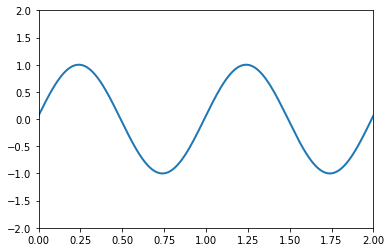

In [11]:
def animate():
    # First set up the figure, the axis, and the plot element we want to animate
    fig, ax = plt.subplots()

    ax.set_xlim(( 0, 2))
    ax.set_ylim((-2, 2))

    line, = ax.plot([], [], lw=2)
    
    # animation function. This is called sequentially
    def sin(i):
        x = np.linspace(0, 2, 1000)
        y = np.sin(2 * np.pi * (x - 0.01 * i))
        line.set_data(x, y)
        return (line,)

    # initialization function: plot the background of each frame
    def init():
        line.set_data([], [])
        return (line,)
    # call the animator. blit=True means only re-draw the parts that have changed.
    anim = animation.FuncAnimation(fig, sin, init_func=init,
                                   frames=100, interval=20, blit=True)
    return HTML(anim.to_jshtml())

animate()

## Drawing histogram

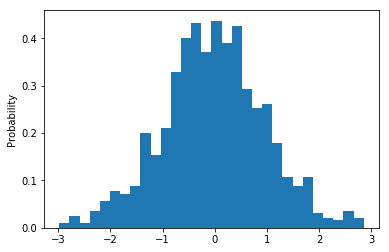

In [2]:
x = np.random.normal(size = 1000)
plt.hist(x, density=True, bins=30)
plt.ylabel('Probability');

## Task 1

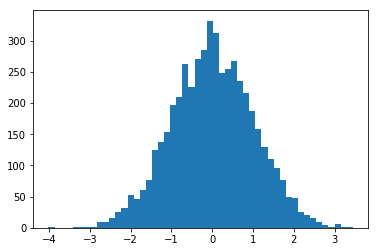

In [16]:
def animate():
    numbers = [];
    
    def update(x,numbers):
        for i in range(5):
            numbers.append(pyro.sample("normal_sampling", 
                                       pyro.distributions.Normal(0, 1)))
        plt.cla()
        plt.hist(numbers,bins=50)
        
    fig = plt.figure()
    
    anim = animation.FuncAnimation(fig, update,
                                   frames=1000, interval=10, fargs=(numbers, ),blit=False)
    return HTML(anim.to_jshtml())
    
animate()

## Task 2

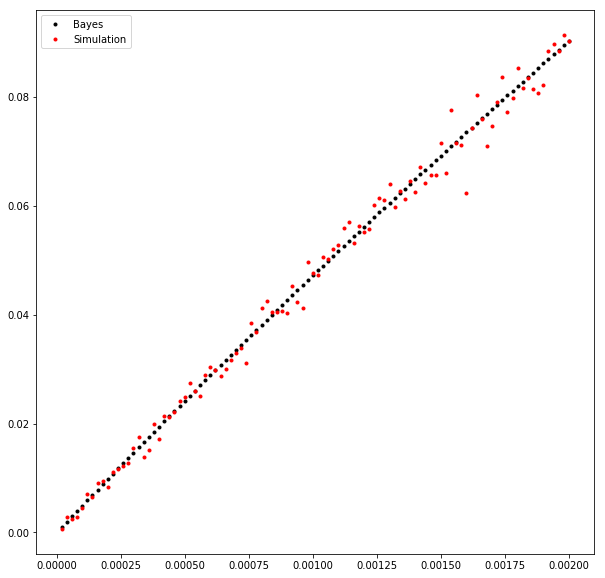

In [32]:
# d - sick
# n - not sick
# plus - test positive result
# minus - test negative result
def get_bayes(d,plus_d = 0.99,minus_n=0.98):
    n = 1-d
    plus_n = 1-minus_n
    d_plus = (plus_d*d)/((plus_d*d)+(plus_n*n))
    return d_plus

def get_sample(probability, size):
    with pyro.plate("population", size):
        return torch.sum(pyro.sample("categorical_sampling", pyro.distributions.Categorical(torch.tensor([1-probability, probability]))))
    
def get_simulation(size, d, plus_n=1-0.98, plus_d=0.99):
    d_sample = get_sample(d, size)
    plus_d_sample = get_sample(plus_d,d_sample)
    plus_n_sample = get_sample(plus_n,size-d_sample)
    d_sample = plus_d_sample + plus_n_sample
    return plus_d_sample.item()/d_sample.item()

population = 500000
bayes = []
simulation = []
probabilities = []

for i in range(100):
    d = (i+1)/50000
    probabilities.append(d)
    bayes.append(get_bayes(d))
    simulation.append(get_simulation(population,d))
    
fig, ax = plt.subplots(figsize=(10, 10))
bayes_plot = ax.plot(probabilities, bayes, 'k.')
simulation_plot = ax.plot(probabilities, simulation, 'r.')
plt.legend(["Bayes","Simulation"])
plt.show()
    

    